In [1]:
! python --version

Python 3.12.2


### Download the paper "Attention is All You Need" from the following link:

In [2]:
# ! wget https://arxiv.org/pdf/1706.03762.pdf -O ../data/attention_is_all_you_need.pdf

In [3]:
from unstructured.partition.pdf import partition_pdf

output_path = "../data/"
file_path = output_path + "Subaru-Impreza-brochure.pdf"

# Reference: https://docs.unstructured.io/open-source/core-functionality/chunking
chunks = partition_pdf(
    filename=file_path,
    infer_table_structure=True,             # extract tables
    strategy="hi_res",                      # mandatory to infer tables
    extract_image_block_types=["Image", "Table"],    # Add 'Table' to list to extract image of tables
    extract_image_block_to_payload=True,    # if true, will extract base64 for API usage
    chunking_strategy="by_title",           # or 'basic'
    max_characters=10000,                   # defaults to 500
    combine_text_under_n_chars=2000,        # defaults to 0
    new_after_n_chars=6000,
)

/Users/josereyes/Dev/multimodal-rag-pdf/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Image Extraction Error: Skipping the failed image
Traceback (most recent call last):
  File "/Users/josereyes/Dev/multimodal-rag-pdf/.venv/lib/python3.12/site-packages/unstructured/partition/pdf_image/pdf_image_utils.py", line 209, in save_elements
    cropped_image.save(buffered, format="JPEG")
  File "/Users/josereyes/Dev/multimodal-rag-pdf/.venv/lib/python3.12/site-packages/PIL/Image.py", line 2596, in save
    save_handler(self, fp, filename)
  File "/Users/josereyes/Dev/multimodal-rag-pdf/.venv/lib/python3.12/site-packages/PIL/JpegImagePlugin.py", line 662, in _save
    raise ValueError(msg)
ValueError: cannot write empty image as JPEG
Image Extraction Error: Skipping the failed image
Traceback (most recen

In [4]:
len(chunks)

17

In [5]:
set([str(type(el)) for el in chunks])

{"<class 'unstructured.documents.elements.CompositeElement'>"}

In [7]:
import json


for i in range(5):
    print(json.dumps(chunks[i].to_dict(), indent=2))

{
  "type": "CompositeElement",
  "element_id": "6bb3747b8a0f1bf7c01b8cb09882f6a4",
  "text": "2024\n\nFor a world discover Lin\u201d\n\nSubaru Impreza AWD 2.0S\n\nwe Be Bi se et ee\n\n5\n\n=\n\nvn J,\n\n\u2019\n\nome\n\n\u00a9\n\ne \u00a5 4 \u00a5\n\nWa\n\n}\n\n\u201c\n\n4 Mee\n\na\n\n\u2018\n\nFrom A to Beyond\n\nWith its potent formula of striking design, intuitive safety and an exhilarating driving experience, the new generation Subaru Impreza is the hot hatch that\u2019s ready to take you from A to Beyond.\n\nSymmetrical AWD\n\n=\u201c y: \\\n\na AAA\n\n?\n\nFS\n\n4 }\n\nS BY We\n\nny\n\n4\n\n\u201ca\n\nVA\n\n+ \u00a5 ae\n\n|\n\nps\n\n\u201c\n\nae\n\nMo\n\nThis sporty hatch delivers the promise of gripping adventures thanks to Subaru's legendary Symmetrical All-Wheel Drive and pulsing Boxer engine. Infused with a new, all-encompassing human-centred design approach, finessed by Subaru\u2019s engineers, both the driver and passengers are rewarded with a level of occupant comfort whi

In [8]:
chunks[5].metadata.orig_elements[8].to_dict()

{'type': 'NarrativeText',
 'element_id': '70ea0cc7-0138-41cc-a619-da5243d737ed',
 'text': 'Subaru Impreza tackles driver distraction and fatigue with Subaru’s ingenious Driver Monitoring System – Driver Focus (DMS)1. This innovative system constantly monitors the driver’s attention to help reduce the chance of accidents.',
 'metadata': {'detection_class_prob': 0.9165188670158386,
  'coordinates': {'points': ((348.69085693359375, 286.66668701171875),
    (348.69085693359375, 710.231201171875),
    (1003.7724629521259, 710.231201171875),
    (1003.7724629521259, 286.66668701171875)),
   'system': 'PixelSpace',
   'layout_width': 2339,
   'layout_height': 1654},
  'last_modified': '2025-02-19T18:54:27',
  'filetype': 'PPM',
  'languages': ['eng'],
  'page_number': 25}}

In [9]:
elements = chunks[3].metadata.orig_elements
chunk_images = [el for el in elements if 'Image' in str(type(el))]
chunk_images[0].to_dict()

{'type': 'Image',
 'element_id': '9eec47fc-82f1-4cd1-bf5c-e00d2d321110',
 'text': 'y IN',
 'metadata': {'detection_class_prob': 0.6703386902809143,
  'coordinates': {'points': ((735.5108032226562, 853.5233154296875),
    (735.5108032226562, 932.8580322265625),
    (1016.7892456054688, 932.8580322265625),
    (1016.7892456054688, 853.5233154296875)),
   'system': 'PixelSpace',
   'layout_width': 2339,
   'layout_height': 1654},
  'last_modified': '2025-02-19T18:54:27',
  'filetype': 'PPM',
  'languages': ['eng'],
  'page_number': 17,
  'image_base64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCABPARkDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJ

In [10]:
# separate tables from texts
tables_info = []
composites = []

for chunk in chunks:
    if "CompositeElement" in str(type((chunk))):
        composites.append(chunk)

In [11]:
# Get the images from the CompositeElement objects
def get_images_base64(chunks):
    images_b64 = []
    for chunk in chunks:
        if "CompositeElement" in str(type(chunk)):
            chunk_els = chunk.metadata.orig_elements
            for el in chunk_els:
                if "Image" in str(type(el)):
                    images_b64.append(el.metadata.image_base64)
    return images_b64

images = get_images_base64(chunks)

In [12]:

def get_tables_info(chunks):
    tables_info = []
    for chunk in chunks:
        if "CompositeElement" in str(type(chunk)):
            chunk_elements = chunk.metadata.orig_elements
            for el in chunk_elements:
                if "Table" in str(type(el)):
                    tables_info.append(
                        {
                            "text_as_html": el.metadata.text_as_html,
                            "image_base64": el.metadata.image_base64,
                        })
    return tables_info

tables_info = get_tables_info(chunks)

In [13]:
len(tables_info)

11

In [14]:
tables_info[3]

{'text_as_html': "<table><thead><tr><th>EXTERIOR COLOUR'</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td>A - Crystal White Pear!</td><td></td><td></td><td></td></tr><tr><td>B - Ice Silver Metallic</td><td></td><td></td><td></td></tr><tr><td>C - Magnetite Grey Metallic</td><td></td><td></td><td></td></tr><tr><td>D - Oasis Blue</td><td></td><td></td><td></td></tr><tr><td>E - Sapphire Blue Pearl</td><td></td><td></td><td></td></tr><tr><td>F - Pure Red</td><td></td><td></td><td></td></tr><tr><td>G - Crystal Black Silica</td><td></td><td></td><td></td></tr></tbody></table>",
 'image_base64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAHUCDkDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJi

In [15]:
composites[1].metadata.orig_elements

In [16]:
images

['/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAW0CRcDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD5/ooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA

In [17]:
len(images)

125

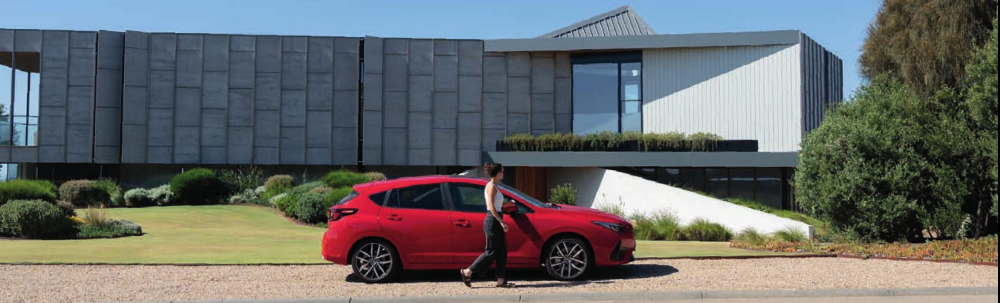

In [22]:
import base64
from IPython.display import Image, display

def display_base64_image(base64_code):
    # Decode the base64 string to binary
    image_data = base64.b64decode(base64_code)
    # Display the image
    display(Image(data=image_data))

display_base64_image(images[20])

In [48]:
from pydantic import BaseModel, Field

class NodeSummaryResponse(BaseModel):
    """
    Response model for summary object of a node 
    """
    summary: str = Field(
        ...,
        description="A detailed summary of the table or text. 8 minimum to 10 sentences max.")

SYSTEM_PROMPT = """
You are an expert assistant tasked with summarizing text and tables.
"""

class NodeSummariser:
    """
    Enhanced document summariser
    """
    def __init__(self, client):
        self.client = client

    def summarise(self, document_text: str) -> tuple[NodeSummaryResponse, dict]:
        """
        Summarise a document text
        """
        try:
            summary, completion = self.client.chat.completions.create_with_completion(
                system=SYSTEM_PROMPT,
                messages=[
                    {
                        "role": "user",
                        "content": f"Give a very detailed summary of the following text or table: {document_text}. \
                            Respond only with the summary, no additionnal comment. Do not start your message by \
                            saying 'Here is a summary' or anything like that. Just give the summary as it is. Don't even \
                            mention the title of the source."
                    }
                    ],
                response_model = NodeSummaryResponse
            )

            return summary, completion
        except Exception as e:
            print(f"Error: {e.args[0].body['message']}")
            return e

In [24]:
from dotenv import load_dotenv

load_dotenv(verbose=True, dotenv_path=".env")

True

In [47]:
import os
import anthropic
import instructor

client = anthropic.AnthropicBedrock(
    aws_access_key=os.getenv("AWS_ACCESS_KEY_ID"),
    aws_secret_key=os.getenv("AWS_SECRET_ACCESS_KEY"),
    aws_session_token=os.getenv("AWS_SESSION_TOKEN"),
    aws_region=os.getenv("AWS_DEFAULT_REGION"),
)

MODEL_ID_HAIKU = "anthropic.claude-3-haiku-20240307-v1:0"
MODEL_ID_SONNET = "anthropic.claude-3-5-sonnet-20241022-v2:0"
USE_MODEL = MODEL_ID_SONNET
# USE_MODEL = MODEL_ID_HAIKU

# Regarding the LLM model choice, I would start with the cheapest option (Haiku) first. Depending on the tasks, the smallest 
# model might be sufficient. You will have to do some trial and error here. I found that the smallest model at times will have
# difficulty following certain instructions. For example, asking the LLM to summarise a body of text and constraining the
# summary say from minimum 100 and maximum 500 characters, the smallest model will sometimes fail to generate a summary
# that is within the character count constraints. In such cases, you might have to try a larger model.

# we are using Instructor (https://github.com/instructor-ai/instructor)
instructor_client = instructor.from_anthropic(
    client,
    max_tokens=4096,
    model=USE_MODEL
)



In [26]:
from pydantic import BaseModel

# Define your desired output structure
class UserInfo(BaseModel):
    name: str
    age: int

user_info = instructor_client.chat.completions.create(
    response_model=UserInfo,
    messages=[{"role": "user", "content": "John Doe is 30 years old."}]
    )

print(user_info.name)
#> John Doe
print(user_info.age)
#> 30

John Doe
30


In [27]:
len(composites)

17

In [28]:
from IPython.display import Markdown, display

for i, item in enumerate(composites):
    node, _ = NodeSummariser(instructor_client).summarise(item)
    display(Markdown(f"**Node {i+1}**:"))
    display(Markdown(node.summary))

**Node 1**:

The new generation model represents a compelling blend of design, safety, and driving dynamics, featuring Subaru's renowned Symmetrical All-Wheel Drive system paired with their signature Boxer engine. The vehicle's interior showcases a sophisticated cabin equipped with modern technology, including an 11.6-inch touchscreen that supports wireless Apple CarPlay and Android Auto connectivity. Safety is enhanced through cutting-edge features like the latest EyeSight Driver Assist and Subaru's Vision Assist. The exterior design combines sharp lines and curved surfaces with aerodynamic functionality, creating an athletic and energetic appearance. The vehicle's human-centered design approach prioritizes comfort for both driver and passengers, making it suitable for urban commuting and adventure driving alike. Built on Subaru's engineering excellence and advanced driving technology, it delivers an engaging driving experience that sets it apart in its class. The model emphasizes versatility, being equally capable of handling daily urban tasks and challenging road conditions. Its performance capabilities are underpinned by Subaru's DNA, ensuring confident handling and dynamic driving characteristics. The overall package is designed to inspire exploration while maintaining practicality for everyday use.

**Node 2**:

The interior of this vehicle showcases a sophisticated, dynamically styled cabin featuring an advanced 11.6-inch touchscreen infotainment system with wireless Apple CarPlay and Android Auto connectivity. The premium audio experience is delivered through a Harman Kardon sound system, offering exceptional clarity for music and podcasts, with convenient voice command functionality. Comfort features include dual-zone climate control and wireless Qi charging capabilities. The design philosophy emphasizes human-centered ergonomics, developed in collaboration with medical experts to optimize natural body movements and create an intuitive cockpit layout. Advanced safety technologies include the latest generation EyeSight Driver Assist and Vision Assist systems, functioning as co-pilot features. The vehicle incorporates Lane Centring Function and Adaptive Cruise Control to minimize driver fatigue during extended journeys. A standout feature is the Panoramic 360 Degree View Monitor, providing comprehensive surrounding visibility. The vehicle utilizes the Subaru Global Platform and includes key technologies such as Symmetrical AWD, Boxer Engine, and Subaru Intelligent Drive (SI-Drive) for enhanced performance and safety.

**Node 3**:

The vehicle combines rally-inspired performance with innovative engineering, featuring five generations of refinement and exceptional handling characteristics. At its core, the car utilizes a unique horizontally-opposed Boxer engine and Symmetrical All-Wheel Drive system, providing superior balance and reduced vibration through its low-mounted engine design. The Lineartronic CVT transmission adapts to driving styles, while the Subaru Intelligent Drive (SI-Drive) offers two distinct driving modes for versatile performance. Interior functionality is emphasized through a thoughtfully designed cargo area with a wide flat load floor and expansive boot opening, complemented by a 60/40 split rear seatback for flexible storage options. The drivetrain configuration delivers simultaneous power to all four wheels, resulting in doubled grip capacity compared to conventional vehicles. This engineering approach translates to exceptional handling on various road conditions, from city streets to country roads. The vehicle's practical design supports both daily commutes and long-distance adventures, while maintaining the balance between performance and safety. The refined platform and low center of gravity work in harmony with the all-wheel-drive system to deliver an engaging and confident driving experience.

**Node 4**:

Subaru's commitment to safety is demonstrated through their ambitious goal of achieving zero fatal road accidents in their vehicles by 2030. This vision is built upon four fundamental safety pillars: Primary, Active, Preventative, and Protective safety, which together form their 'All-Around' approach to automotive manufacturing. The EyeSight® Driver Assist system, standard on Subaru Impreza, functions as an additional pair of eyes with multiple primary safety features including Pre-Collision systems, Adaptive Cruise Control, and various Lane Assistance technologies. The system incorporates advanced features such as Lane Departure Prevention and Lane Centring Function, working in conjunction with Adaptive Cruise Control to maintain vehicle positioning. Autonomous Emergency Steering utilizes EyeSight® cameras and rear radar to assist with evasive maneuvers when detecting potential collisions. The Vision Assist technology further enhances safety by employing embedded cameras and radar to detect vehicles and obstacles in blind spots. This comprehensive safety approach combines with EyeSight® Driver Assist to provide drivers with enhanced preventative safety capabilities.

**Node 5**:

The Panoramic 360 Degree View Monitor represents a comprehensive safety system that enhances driver awareness and parking precision. The system includes EyeSight® Assist Monitor, which projects warning lights onto the lower windscreen when safety functions are activated. The Blind Spot Monitor uses rear sensors to detect vehicles in blind spots, while Lane Change Assist warns of fast-approaching vehicles in adjacent lanes. The system incorporates Rear Cross Traffic Alert to warn of approaching vehicles when reversing, and Reverse Automatic Braking that can automatically engage if obstacles are detected. Front View Monitor utilizes a grille-mounted camera to help prevent front-end damage during parking, while Side View Monitor employs a passenger door mirror camera to show distance from curbs or parked vehicles. High Beam Assist automatically adjusts headlight beams to prevent dazzling other road users while maintaining optimal visibility. The vehicle's safety features extend to its structural design, with designated crumple zones that channel impact energy away from the passenger cell, and a Boxer engine designed to slide beneath the cabin during severe frontal collisions. These features are specifically available on Subaru Impreza AWD 2.0R and 2.0S models.

**Node 6**:

Subaru has established an ambitious goal of achieving zero fatal road accidents in their vehicles by 2030, demonstrating their longstanding commitment to safety innovation. The Subaru Impreza incorporates sophisticated safety features, most notably the ring-shaped passenger safety cell, which is engineered to redirect collision impact around the cabin rather than through it. The vehicle's unique symmetrical All-Wheel Drive system and horizontally-opposed Boxer engine are strategically designed to slide beneath the floor during severe frontal impacts, enhancing occupant protection. The chassis incorporates specialized crushable zones that effectively absorb collision energy, while nine SRS airbags provide additional protection for passengers in serious accidents. To address human factors in road safety, the Impreza features an advanced Driver Monitoring System (DMS), which continuously monitors driver attention to help prevent accidents caused by fatigue or distraction. The vehicle's comprehensive safety approach combines structural integrity, impact absorption, and active monitoring systems, all built upon the Subaru Global Platform. The entire safety system reflects decades of research, observation, and structural development aimed at maximizing occupant protection and road safety.

**Node 7**:

The text describes Subaru's Driver Monitoring System (DMS) and the Subaru Impreza AWD 2.0S model's features and customization options. The DMS employs infrared LEDs and camera technology to detect driver fatigue or distraction, issuing alerts when necessary to ensure road safety. This system includes intelligent facial recognition capability that can remember up to five different drivers and automatically adjust cabin settings like climate control and display preferences. The Subaru Impreza AWD 2.0S is presented as a sporty all-wheel drive hatch designed for performance and style. The vehicle can be enhanced with various Genuine Subaru Accessories, including an STI Front Under Spoiler, custom alloy wheels, roof cross bars, and protective elements like bootlip and bumper mats. A comprehensive range of lifestyle-oriented accessories is available, such as roof-mounted bike holders and cargo trays, allowing owners to customize their vehicle according to their specific needs. The DMS functionality is noted to be dependent on environmental and technical conditions, with full details available in the Owner's Manual.

**Node 8**:

The accessory catalog showcases a comprehensive range of customization and enhancement options for Subaru Impreza vehicles across three trim levels: AWD 2.0L, AWD 2.0R, and AWD 2.0S. The accessories are organized into distinct categories including styling, protection, and lifestyle enhancements. Notable styling options include an STI front grille, roof spoiler in black, and side sill plates, while protection features comprise weather shields, carpet and rubber mat sets, and mud guards. The catalog offers extensive roof-mounted accessories through Thule, including various ski carriers, bicycle holders, and roof boxes in different sizes and finishes. Security features include wheel lock nuts and specialized lug nut sets. Convenience and safety accessories encompass first aid kits, safety triangles, and Garmin dash cam options. All accessories are clearly marked for compatibility across the three trim levels, with most items being universally compatible across the range. The catalog emphasizes both practical protection and aesthetic enhancement options, allowing owners to customize their vehicles according to their specific needs and preferences.

**Node 9**:

The accessories lineup for the Subaru Impreza includes various STI Performance Parts, with front under spoilers available in both Black and Cherry Red finishes. The vehicle offers rear side under spoilers in matching colors, along with additional performance enhancements such as an STI roof spoiler, shift knob for CVT transmission, and a flexible tower bar. For wheel options, STI ENKEI alloy wheel sets are available in 17-inch and 18-inch sizes, each offered in Silver, Gun Metal, and Black finishes. The Impreza comes in three main variants: AWD 2.0L, AWD 2.0R, and AWD 2.0S, with all models being compatible with the listed accessories. The exterior color palette features seven distinct options including Crystal White Pearl, Ice Silver Metallic, Magnetite Grey Metallic, Oasis Blue, Sapphire Blue Pearl, Pure Red, and Crystal Black Silica. Interior trim options vary by model, featuring tricot fabric in black, premium black cloth, and leather-accented black upholstery. The vehicle's design emphasizes a combination of bold sophistication and urban styling, showcasing aerodynamic functionality alongside modern aesthetics.

**Node 10**:

The vehicle lineup features comprehensive standard equipment across all models, anchored by Subaru's signature Symmetrical All-Wheel Drive system and Lineartronic CVT transmission. Safety is prioritized through multiple advanced systems including EyeSight Driver Assist technology, Vision Assist, and Driver Monitoring System. Interior comfort and convenience are addressed with dual-zone climate control, 60/40 split folding rear seats, and heated front seats. The central infotainment system incorporates an 11.6-inch touchscreen with wireless Apple CarPlay and Android Auto connectivity, complemented by USB-A and USB-C ports. Performance and handling features include Auto Stop Start functionality, Subaru Intelligent Drive with two modes, and electronic parking brake. Premium audio options include a Harman Kardon speaker system with amplifier, while safety is further enhanced by SRS6 airbags including dual front, side, curtain, driver's knee, far side, and front passenger seat cushion airbags. The exterior is equipped with LED headlights, 17-inch alloy wheels, and a rear spoiler. Navigation capabilities are provided through satellite navigation, and convenience features extend to smart key with push-start ignition and wireless Qi charging functionality.

**Node 11**:

The document outlines specifications and features for Subaru vehicles, particularly focusing on the Impreza model line. The vehicles come equipped with 18-inch alloy wheels and Subaru's comprehensive Vision Assist package, which includes High Beam Assist and a Panoramic 360 Degree View Monitor system with front and side view capabilities. The transmission system features a Lineartronic CVT with eight forward gear ratios ranging from 4.066 to 0.559, and a reverse ratio of 4.379. The powerplant is a horizontally-opposed Boxer 4-cylinder petrol engine with a displacement of 1995cc, producing maximum power of 115kW at 6000rpm and peak torque of 196Nm at 4000rpm. Fuel efficiency figures indicate a combined consumption of 7.5L/100km, with urban usage at 9.7L/100km and extra urban at 6.2L/100km. The vehicle features luxury amenities including an electric sunroof and leather-accented interior, while also incorporating modern technology such as digital radio reception and Siri compatibility. The fuel system employs direct injection technology and requires a minimum RON 91 fuel grade, with a tank capacity of 50 litres.

**Node 12**:

The table provides comprehensive specifications and safety features across three Subaru Impreza models: AWD 2.0L, AWD 2.0R, and AWD 2.0S. All models share core mechanical characteristics, including Symmetrical All-Wheel Drive with Auto Active Torque Split and electric power-assisted rack and pinion steering, with a minimum turning circle of 10.6m. The suspension system combines MacPherson strut front suspension with double wishbone rear suspension, while the braking system features ventilated disc brakes both front and rear. The vehicle dimensions are consistent across models, with an overall length of 4490mm, width of 1780mm, height of 1480mm, and wheelbase of 2670mm. The models differ in their wheel and tire specifications, with the higher trim levels featuring larger wheels (17" to 18") and corresponding tire sizes. In terms of safety features, all models are equipped with comprehensive collision avoidance systems including Vehicle Dynamics Control, Active Torque Vectoring, and various driver assistance technologies such as Driver Monitoring System, Vision Assist, and EyeSight features. The vehicles also share identical passive safety features, including multiple SRS airbags, ring-shaped passenger safety cell, and adjustable headrests for both front and rear seats.

**Node 13**:

The specifications detail comprehensive features across three Subaru Impreza variants: AWD 2.0L, AWD 2.0R, and AWD 2.0S. All models prioritize child safety with triple anchor points, ISOFIX compatibility, and rear door child locks. The vehicles incorporate advanced driving technology including Auto Stop Start and Subaru Intelligent Drive with multiple modes. The EyeSight® Driver Assist system is standard across all variants, offering extensive safety features such as Adaptive Cruise Control, Lane Departure Prevention, and Pre-Collision systems. Exterior features include body-colored elements, heated power-folding mirrors, and either 17" or 18" alloy wheels depending on the model. The higher-end variants (2.0R and 2.0S) are equipped with LED lighting systems including steering responsive headlights and front cornering lamps. Interior amenities include dual-zone climate control, electroluminescent gauges, paddle gear shifters, and comprehensive storage solutions including console boxes and cargo hooks. Notable convenience features include auto door lock/unlock systems, power jacks, and privacy glass for rear windows.

**Node 14**:

The specification table outlines three Subaru Impreza models: AWD 2.0L, AWD 2.0R, and AWD 2.0S, detailing their various features and amenities. All models come equipped with essential comfort features including power mirrors, windows, smart key ignition, and rain-sensing wipers. The interior specifications vary across models, with higher trims offering leather-accented seating, heated front seats, and an 8-way power driver's seat with electric lumbar support. Entertainment systems are comprehensive across the range, featuring an 11.6" touchscreen with wireless Apple CarPlay and Android Auto connectivity, with the premium trim including a 10-speaker Harman Kardon audio system. All models include modern connectivity options with USB-A and USB-C ports, wireless Qi charging capabilities, and Bluetooth technology for audio streaming and hands-free communication. The vehicles come with substantial owner benefits, including a 5 Year/Unlimited Kilometer Warranty, a 5 Year/75,000 Km Capped Price Servicing Program, and a 12 Month Roadside Assistance Program, demonstrating Subaru's commitment to customer support and vehicle maintenance.

**Node 15**:

The comprehensive ownership program offers several key benefits for new Subaru vehicle owners. A standout feature is the 5-year unlimited kilometer manufacturer's warranty for private use vehicles, while commercial use vehicles are covered for 5 years or 150,000 kilometers. The program includes a Capped Price Servicing initiative, which provides transparency and predictability for scheduled maintenance costs, with work performed by specialized Subaru technicians using genuine parts. Within the first month of ownership, customers receive a complimentary health check and consultation with factory-trained technicians to ensure proper vehicle operation and address any concerns. For vehicles equipped with factory-fitted navigation systems, owners benefit from Subaru's Map Update Program, ensuring access to the latest navigation data for the first three years of ownership. These benefits specifically apply to Model Year 2024 Subaru Impreza vehicles, with the Capped Price Servicing Program available through participating retailers. The program emphasizes Subaru's commitment to customer satisfaction and long-term vehicle care, positioning ownership as an empowering experience rather than mere transportation.

**Node 16**:

The comprehensive service package includes 12 months of nationwide standard Roadside Assistance for new Subaru purchases, offering services like towing, battery service, flat tire assistance, fuel delivery, and lockout support. The company provides Subaru Premier Motor Vehicle Insurance to protect vehicles and owners' investments, along with a Certified Collision Repairer Network accessible through a 24/7 helpline. The certified repair network ensures vehicles are fixed to factory specifications using genuine parts. For used vehicle buyers, Subaru offers Certified Used Cars that undergo a rigorous 120-point quality inspection. The ownership experience is enhanced by 12-month/15,000km service intervals and a 5 Year/Unlimited Kilometer Warranty, while genuine Subaru accessories are available with factory approval and warranty protection. Through Subaru Financial Services, customers can access financing options to facilitate both initial purchases and future upgrades, available at participating retailers. The company maintains strict eligibility criteria for its Club Membership and Roadside Assistance program, primarily targeting retail and novated lease customers with fewer than 5 vehicles. Important warranty conditions apply, with special terms for commercial-use vehicles, and all financial services are subject to credit approval and specific terms and conditions.

**Node 17**:

The automotive model has garnered numerous prestigious accolades spanning over two decades, demonstrating its consistent excellence in the market. Most recently, it secured the Canstar Blue Most Satisfied Customers award for New Cars in 2023, followed by its parent company winning the Roy Morgan Annual Customer Satisfaction Award for Major Car Manufacturer in 2021. The vehicle's commitment to safety has been repeatedly validated through multiple 5-star ANCAP safety ratings from the Australasian New Car Assessment Program, specifically in 2016, 2011, and 2007, covering the entire model range. Earlier achievements include the 2003 Australia's Best Cars award in the Mid-Size Car under $28,000 category for the GX variant. The turn of the millennium proved particularly successful, with the model securing both the prestigious Wheels Car of the Year award and the Queensland Car of the Year Award for Outstanding Compact Car in 2000. These accolades collectively highlight the vehicle's enduring reputation for customer satisfaction, safety excellence, and overall performance in the Australian automotive market.

In [29]:
len(tables_info)

11

In [53]:
for i, item in enumerate(tables_info):
    # print(item)
    print(len(item["text_as_html"]))
    node, _ = NodeSummariser(instructor_client).summarise(item["text_as_html"])
    display(Markdown(f"**Table {i+1}**:"))
    display(Markdown(item["text_as_html"]))
    display(Markdown(f"**Table {i+1} Summary**:"))
    display(Markdown(node.summary))

1982


**Table 1**:

<table><thead><tr><th>PART NUMBER</th><th>ACCESSORY</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="5">Styling</td></tr><tr><td>J1010FN510</td><td>Front Grille</td><td>.</td><td>.</td><td>°</td></tr><tr><td>E7210FN020V2</td><td>Rear Roof Spoiler - Black</td><td>°</td><td>.</td><td>°</td></tr><tr><td>E1010FNO00</td><td>Side Sill Plate</td><td>.</td><td>°</td><td>.</td></tr><tr><td colspan="5">Protection</td></tr><tr><td>FOO10FNO10</td><td>Weather Shields</td><td>.</td><td>.</td><td>°</td></tr><tr><td>J501AFNO00</td><td>Carpet Mat Set</td><td>.</td><td>.</td><td>°</td></tr><tr><td>J5010FN100</td><td>Rubber Mat Set</td><td>°</td><td>.</td><td>°</td></tr><tr><td>J1010FN300NN</td><td>Mud Guards Set (unpainted)</td><td></td><td></td><td></td></tr><tr><td>J1010FN301NN</td><td>Mud Guards Front (unpainted)</td><td></td><td></td><td></td></tr><tr><td>J1010FN304NN</td><td>Mud Guards Rear (unpainted)</td><td></td><td></td><td></td></tr><tr><td>F4110FNO00</td><td>All Weather Seat Cover - Front</td><td>°</td><td>.</td><td>°</td></tr><tr><td>F4110FN010</td><td>All Weather Seat Cover - Rear</td><td>°</td><td>°</td><td>°</td></tr><tr><td>J1010FL710NN</td><td>Body Side Moulding! (painting required)</td><td>°</td><td>°</td><td>°</td></tr><tr><td>E7710FN020</td><td>Cargo Step Panel - (Stainless)</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT6003</td><td>Bootlip &amp; Bumper Protector</td><td>°</td><td>.</td><td>°</td></tr><tr><td colspan="5">Cargo</td></tr><tr><td>SAT3035</td><td>Roof Cross Bars - Silver</td><td>.</td><td>.</td><td>°</td></tr><tr><td>SAT3036</td><td>Roof Cross Bars - Black</td><td>°</td><td>.</td><td>°</td></tr><tr><td>SAT3037</td><td>Roof Cross Bars - Wingbar Edge - Silver</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT3038</td><td>Roof Cross Bars - Wingbar Edge - Black</td><td>.</td><td>.</td><td>.</td></tr><tr><td>J501AFN100</td><td>Cargo Tray</td><td>.</td><td>.</td><td>°</td></tr></tbody></table>

**Table 1 Summary**:

This comprehensive accessories table details various options available across three AWD models: 2.0L, 2.0R, and 2.0S, organized into three main categories: Styling, Protection, and Cargo. In the Styling section, items like Front Grille, Rear Roof Spoiler in black, and Side Sill Plate are offered with varying availability across models. The Protection category is particularly extensive, featuring weather-related items such as Weather Shields, Carpet Mat Set, and Rubber Mat Set. It also includes multiple mud guard options, all-weather seat covers for both front and rear seats, body side molding requiring painting, and a stainless cargo step panel. For cargo management, the table presents multiple roof cross bar options in both silver and black finishes, including standard and Wingbar Edge variants. Each accessory is identified by a specific part number, and availability is indicated by different symbols across the three AWD models, with some items being universally available and others model-specific. Notable protection accessories like the Bootlip & Bumper Protector and cargo solutions like the Cargo Tray demonstrate the comprehensive range of practical additions available for these vehicles.

2214


**Table 2**:

<table><thead><tr><th>PART NUMBER</th><th>ACCESSORY</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="5">Thule Roof Attachments and Accessories (Roof Cross Bars Required)</td></tr><tr><td>SAT8023</td><td>Deluxe Ski Carrier - 4 Pair</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT8024</td><td>Deluxe Ski Carrier - 6 Pair</td><td>°</td><td>.</td><td>°</td></tr><tr><td>SAT8028</td><td>Bicycle Holder Upright</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT8018</td><td>Bicycle Holder - Silver (ProRide)</td><td>°</td><td>.</td><td>.</td></tr><tr><td>SAT8019</td><td>Bicycle Holder - Black (ProRide)</td><td>.</td><td>.</td><td>.</td></tr><tr><td>SAT9012</td><td>Ski Holder - 4 Pair</td><td>.</td><td>.</td><td>.</td></tr><tr><td>SAT9013</td><td>Ski Holder - 6 Pair</td><td>.</td><td>.</td><td>.</td></tr><tr><td>SAT9019</td><td>Kayak Carrier - Dockglide</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT8032</td><td>Thule Roof Basket</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT8041</td><td>Thule Surfpad (Large)</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT8042</td><td>Thule Tiedown Straps (2)</td><td>.</td><td>.</td><td>.</td></tr><tr><td>SAT5013</td><td>Roof Box - Thule Force XT M (Matte Black)</td><td>.</td><td>.</td><td>.</td></tr><tr><td>SAT5014</td><td>Roof Box - Thule Force XT L (Matte Black)</td><td>°</td><td>.</td><td>°</td></tr><tr><td>SAT5018</td><td>Roof Box - Thule Vector M</td><td>°</td><td>°</td><td>°</td></tr><tr><td>SAT8030</td><td>Thule GoPack Set (4 bags for roof box)</td><td>°</td><td>°</td><td>°</td></tr><tr><td colspan="5">Security</td></tr><tr><td>B327EYA000</td><td>Wheel Lock Nuts</td><td>°</td><td>.</td><td>°</td></tr><tr><td>B321SFLO20</td><td>Wheel Lug Nut and Lock Set - Black</td><td>°</td><td>°</td><td>°</td></tr><tr><td colspan="5">Convenience and Safety</td></tr><tr><td>SAC2010</td><td>First Aid Kit</td><td>.</td><td>.</td><td>.</td></tr><tr><td>SAT9007</td><td>Safety Triangle</td><td>°</td><td>°</td><td>°</td></tr><tr><td>0100250410</td><td>Garmin Dash Cam Mini 2!</td><td>°</td><td>°</td><td>°</td></tr><tr><td>0100250511</td><td>Garmin Dash Cam 57!</td><td>.</td><td>.</td><td>.</td></tr></tbody></table>

**Table 2 Summary**:

This comprehensive accessories catalog details various Thule roof attachments and security features compatible with AWD 2.0L, 2.0R, and 2.0S vehicle models. The roof attachments section includes multiple ski carrier options, from 4-pair to 6-pair capacities, along with different bicycle holder variants including the ProRide model in both silver and black finishes. For water sports enthusiasts, the Dockglide kayak carrier is available, while cargo solutions include the Thule roof basket and various roof boxes such as the Force XT series in medium and large sizes, and the premium Vector M model. The GoPack set, consisting of four specialized bags for roof box organization, complements the storage solutions. Security features encompass wheel protection with both standard wheel lock nuts and a specialized black wheel lug nut and lock set. The convenience and safety category offers essential items including a first aid kit and safety triangle for emergency situations. Modern technology integration is addressed through Garmin dash cam options, featuring both the compact Mini 2 and the more advanced Dash Cam 57 models. Most accessories show varying availability across the different AWD models, indicated by specific compatibility markers.

1696


**Table 3**:

<table><thead><tr><th>PART NUMBER</th><th>ACCESSORY</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="5">STI Performance Parts</td></tr><tr><td>E2410FNO00</td><td>STI Front Under Spoiler - Black</td><td>o</td><td>°</td><td>O</td></tr><tr><td>E2410FN010</td><td>STI Front Under Spoiler - Cherry Red</td><td>:</td><td>°</td><td>°</td></tr><tr><td>E5610FNO00</td><td>STI Rear Side Under Spoiler - Black</td><td>°</td><td>°</td><td>°</td></tr><tr><td>E5610FN010</td><td>STI Rear Side Under Spoiler - Cherry Red</td><td>°</td><td>.</td><td>°</td></tr><tr><td>E7210FNO00</td><td>STI Roof Spoiler</td><td>.</td><td>.</td><td>.</td></tr><tr><td>C1010FNO00</td><td>STI Shift Knob CVT</td><td>.</td><td>.</td><td></td></tr><tr><td>E40</td><td>STI Flexible Tower Bar</td><td>:</td><td>.</td><td>°</td></tr><tr><td></td><td>STI Push Engine Switch</td><td></td><td></td><td></td></tr><tr><td>ST91099ST080</td><td>STI Door Handle Protector</td><td>0</td><td>.</td><td>0</td></tr><tr><td>B3110FN100K</td><td>STI ENKEI Alloy Wheel Set (4) - 17in (Silver)</td><td>°</td><td></td><td></td></tr><tr><td>B3110FN110K</td><td>STI ENKEI Alloy Wheel Set (4) - 17in (Gun Metal)</td><td>°</td><td></td><td></td></tr><tr><td>B3110FN120K</td><td>STI ENKEI Alloy Wheel Set (4) - 17in (Black)</td><td>.</td><td></td><td></td></tr><tr><td>B3110VCOOOK</td><td>STI ENKEI Alloy Wheel Set (4) - 18in (Silver)</td><td></td><td>.</td><td>°</td></tr><tr><td>B3110VC010K</td><td>STI ENKEI Alloy Wheel Set (4) - 18in (Gun Metal)</td><td></td><td>.</td><td>.</td></tr><tr><td>B3110VC020K</td><td>STI ENKEI Alloy Wheel Set (4) - 18in (Black)</td><td></td><td>.</td><td>°</td></tr></tbody></table>

**Table 3 Summary**:

The table details STI Performance Parts availability across three AWD models: 2.0L, 2.0R, and 2.0S. Front Under Spoilers are offered in both Black and Cherry Red finishes, with varying availability across models. Rear Side Under Spoilers follow a similar pattern, available in both color options. The STI Roof Spoiler appears to be consistently available across all three models. For transmission enthusiasts, an STI Shift Knob CVT is listed for certain models. The STI Flexible Tower Bar and Door Handle Protector are offered with different availability patterns across the model range. A comprehensive wheel selection is presented, with STI ENKEI Alloy Wheels available in three finishes (Silver, Gun Metal, and Black) and two sizes (17-inch and 18-inch). The 17-inch wheels are primarily compatible with the 2.0L model, while the 18-inch variants are designed for the 2.0R and 2.0S models. Each part is identified by a specific part number, ensuring precise ordering and fitment.

591


**Table 4**:

<table><thead><tr><th>EXTERIOR COLOUR'</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td>A - Crystal White Pear!</td><td></td><td></td><td></td></tr><tr><td>B - Ice Silver Metallic</td><td></td><td></td><td></td></tr><tr><td>C - Magnetite Grey Metallic</td><td></td><td></td><td></td></tr><tr><td>D - Oasis Blue</td><td></td><td></td><td></td></tr><tr><td>E - Sapphire Blue Pearl</td><td></td><td></td><td></td></tr><tr><td>F - Pure Red</td><td></td><td></td><td></td></tr><tr><td>G - Crystal Black Silica</td><td></td><td></td><td></td></tr></tbody></table>

**Table 4 Summary**:

The table presents a comprehensive color palette available across three different AWD model variants: the 2.0L, 2.0R, and 2.0S. Seven distinct exterior color options are offered, each carefully selected to complement the vehicle's design. The selection begins with Crystal White Pearl, providing a pristine and elegant appearance. Ice Silver Metallic and Magnetite Grey Metallic offer sophisticated neutral options, while Oasis Blue and Sapphire Blue Pearl deliver vibrant blue tones for those seeking more expressive choices. Pure Red stands as the bold, dynamic option in the lineup. The range is completed by Crystal Black Silica, offering a classic and sophisticated appearance. The table's structure suggests these colors are uniformly available across all three AWD variants, though specific availability is not explicitly indicated in the cells.

2386


**Table 5**:

<table><thead><tr><th>Model</th><th></th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="5">Transmission</td></tr><tr><td>Lineartronic® CVT</td><td></td><td>°</td><td>*</td><td>O</td></tr><tr><td>D range</td><td></td><td></td><td>4.066 - 0.503</td><td></td></tr><tr><td>Gear ratio</td><td>1st</td><td></td><td>4.066</td><td></td></tr><tr><td></td><td>2nd</td><td></td><td colspan="2">2.628</td></tr><tr><td></td><td>3rd</td><td></td><td>1.911</td><td></td></tr><tr><td></td><td>4th</td><td></td><td>1.535</td><td></td></tr><tr><td></td><td>5th</td><td></td><td>1.195</td><td></td></tr><tr><td></td><td>6th</td><td></td><td>0.914</td><td></td></tr><tr><td></td><td>7th</td><td></td><td>0.717</td><td></td></tr><tr><td></td><td>8th</td><td></td><td>0.559</td><td></td></tr><tr><td>Gear ratio - reverse</td><td></td><td></td><td>4.379</td><td></td></tr><tr><td>Final reduction gear ratio</td><td></td><td></td><td>3.700</td><td></td></tr><tr><td colspan="5">Engine</td></tr><tr><td>Engine type</td><td></td><td></td><td>Horizontally-opposed Boxer 4-cylinder,</td><td>petrol engine</td></tr><tr><td>Valve mechanism</td><td></td><td></td><td>DOHC with Dual AVCS</td><td></td></tr><tr><td>Bore x stroke</td><td>mm</td><td></td><td>84.0 x 90.0</td><td></td></tr><tr><td>Capacity</td><td>cc</td><td></td><td>1995</td><td></td></tr><tr><td>Compression ratio</td><td></td><td></td><td>12.5:1</td><td></td></tr><tr><td>Fuel tank capacity</td><td>litres</td><td></td><td>50</td><td></td></tr><tr><td>Fuel system</td><td></td><td></td><td>Direct injection</td><td></td></tr><tr><td>Fuel requirement (min)</td><td>RON</td><td></td><td>91</td><td></td></tr><tr><td colspan="5">Performance?</td></tr><tr><td>Engine maximum power</td><td>kW/rpm</td><td></td><td>115kW@6000rpm</td><td></td></tr><tr><td colspan="5">Engine maximum torque Nm/rpm 196Nm@4000rpm Fuel consumption (ADR 81/02)</td></tr><tr><td colspan="5">For comparison purposes only. Real world results may vary*:</td></tr><tr><td></td><td>1/100km</td><td></td><td>7.5</td><td></td></tr><tr><td></td><td>1/100km</td><td></td><td>9.7</td><td></td></tr><tr><td></td><td>1/100km</td><td></td><td>6.2</td><td></td></tr><tr><td colspan="5">CO, emissions (ADR 81/02) For comparison purposes only. Real world results may vary:</td></tr><tr><td></td><td>(g/km)</td><td colspan="3">170</td></tr></tbody></table>

**Table 5 Summary**:

The technical specifications detail three variants of an AWD vehicle model with a 2.0-liter engine configuration. The transmission system features a Lineartronic CVT with eight forward gear ratios, ranging from 4.066 to 0.559, and a reverse gear ratio of 4.379. The powerplant is a horizontally-opposed Boxer four-cylinder petrol engine equipped with DOHC and Dual AVCS valve mechanism technology. The engine's specifications include an 84.0 x 90.0mm bore x stroke, 1995cc capacity, and a 12.5:1 compression ratio, delivering maximum power output of 115kW at 6000rpm and peak torque of 196Nm at 4000rpm. Fuel efficiency metrics indicate consumption rates of 7.5, 9.7, and 6.2 l/100km under different driving conditions, with CO2 emissions rated at 170 g/km. The vehicle operates on a minimum fuel requirement of 91 RON through a direct injection system and features a 50-liter fuel tank capacity. The final reduction gear ratio is set at 3.700, optimizing power delivery across the AWD system.

2121


**Table 6**:

<table><thead><tr><th>Model</th><th></th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="5">Symmetrical All-Wheel Drive</td></tr><tr><td>Type</td><td>Auto</td><td></td><td>Active Torque Split</td><td></td></tr><tr><td colspan="5">Steering</td></tr><tr><td>Type</td><td></td><td></td><td>Electric power assisted rack and pinion</td><td></td></tr><tr><td>Minimum turning circle</td><td>m</td><td></td><td>10.6</td><td></td></tr><tr><td colspan="5">Suspension</td></tr><tr><td>Type</td><td>Front</td><td></td><td>MacPherson strut type suspension</td><td></td></tr><tr><td></td><td>Rear</td><td></td><td>Double wishbone type suspension</td><td></td></tr><tr><td>Brakes</td><td></td><td></td><td></td><td></td></tr><tr><td>Type</td><td>Front</td><td></td><td>Ventilated disc brake</td><td></td></tr><tr><td></td><td>Rear</td><td></td><td>Ventilated disc brake</td><td></td></tr><tr><td colspan="5">Wheels and Tyres</td></tr><tr><td>Tyres (width, profile, size, load index and speed rating)</td><td></td><td>205/50R17 89V</td><td>225/40R18 92W.</td><td></td></tr><tr><td>Rim size</td><td></td><td>17x75</td><td>18x7.5J</td><td></td></tr><tr><td>Wheels</td><td></td><td>17"</td><td>18"</td><td></td></tr><tr><td>Spare wheel</td><td></td><td></td><td>Temporary wheel</td><td></td></tr><tr><td colspan="5">Measurement</td></tr><tr><td colspan="5">Overall length mm 4490</td></tr><tr><td>Overall width</td><td>mm</td><td></td><td>1780</td><td></td></tr><tr><td>Overall height</td><td>mm</td><td></td><td>1480</td><td></td></tr><tr><td>Wheel base</td><td>mm</td><td></td><td colspan="2">2670</td></tr><tr><td>Front track</td><td>mm</td><td></td><td>1540</td><td></td></tr><tr><td>Rear track</td><td>mm</td><td></td><td>1545</td><td></td></tr><tr><td>Minimum ground clearance</td><td>mm</td><td></td><td colspan="2">130</td></tr><tr><td>Cargo volume - rear seat up/down</td><td>litres</td><td></td><td>291/883</td><td></td></tr><tr><td>Tare mass?</td><td>kg</td><td>1416</td><td>1435</td><td>1458</td></tr><tr><td>Seating capacity</td><td></td><td></td><td>5</td><td></td></tr></tbody></table>

**Table 6 Summary**:

This vehicle specification table details three AWD model variants featuring Symmetrical All-Wheel Drive, with the 2.0R utilizing Active Torque Split technology. The steering system employs electric power-assisted rack and pinion with a minimum turning circle of 10.6 meters. The suspension configuration combines MacPherson strut type in the front with double wishbone type in the rear, while the braking system features ventilated disc brakes on both front and rear. The models differ in their wheel and tire specifications, with the AWD 2.0L featuring 17-inch wheels with 205/50R17 89V tires, while the 2.0R upgrades to 18-inch wheels with 225/40R18 92W tires. The vehicle's dimensions include a length of 4490mm, width of 1780mm, and height of 1480mm, with a wheelbase of 2670mm. Ground clearance is set at 130mm, and the cargo capacity ranges from 291 to 883 liters depending on rear seat position. The tare mass varies across models from 1416kg to 1458kg, with all variants offering seating for five passengers. The track measurements are precisely specified at 1540mm for the front and 1545mm for the rear.

2586


**Table 7**:

<table><thead><tr><th>Model</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="4">Collision Avoidance</td></tr><tr><td>Symmetrical All-Wheel Drive (AWD)</td><td></td><td></td><td></td></tr><tr><td>Vehicle Dynamics Control system (VDC) featuring:</td><td></td><td></td><td></td></tr><tr><td>Active Torque Vectoring System</td><td></td><td></td><td></td></tr><tr><td>Anti-lock Braking System (ABS)</td><td></td><td></td><td></td></tr><tr><td>Brake Assist</td><td></td><td></td><td></td></tr><tr><td>Electronic Brakeforce Distribution (EBD)</td><td></td><td></td><td></td></tr><tr><td>Electronic Stability Control (ESC)</td><td></td><td></td><td></td></tr><tr><td>Traction Control System (TCS)</td><td></td><td></td><td></td></tr><tr><td>Auto Vehicle Hold (AVH)</td><td></td><td></td><td></td></tr><tr><td>Electronic parking brake</td><td></td><td></td><td></td></tr><tr><td>Driver Monitoring System - Driver Focus? featuring:</td><td></td><td></td><td></td></tr><tr><td>Climate control setting (last used)</td><td></td><td></td><td></td></tr><tr><td>Distraction warning</td><td></td><td></td><td></td></tr><tr><td>Drowsiness warning</td><td></td><td></td><td></td></tr><tr><td>Facial recognition</td><td></td><td></td><td></td></tr><tr><td>MID display (last used)</td><td></td><td></td><td></td></tr><tr><td>Rear view reverse camera</td><td></td><td></td><td></td></tr><tr><td>Vision Assist featuring:</td><td></td><td></td><td></td></tr><tr><td>Blind Spot Monitor (BSM)</td><td></td><td></td><td></td></tr><tr><td>EyeSight” Assist Monitor</td><td></td><td></td><td></td></tr><tr><td>Front Side Radar</td><td></td><td></td><td></td></tr><tr><td>Front View Monitor (FVM)</td><td></td><td></td><td></td></tr><tr><td>High Beam Assist (HBA)</td><td></td><td></td><td></td></tr><tr><td>Lane Change Assist (LCA)</td><td></td><td></td><td></td></tr><tr><td>Panoramic 360 Degree View Monitor</td><td></td><td></td><td></td></tr><tr><td>Rear Cross Traffic Alert (RCTA)</td><td></td><td></td><td></td></tr><tr><td>Rear Parking sensors</td><td></td><td></td><td></td></tr><tr><td>Reverse Automatic Braking (RAB)</td><td></td><td></td><td></td></tr><tr><td>Side View Monitors (SVM)</td><td></td><td>Passenger/Driver</td><td>Passenger/Driver</td></tr><tr><td colspan="4">Collision Protection</td></tr><tr><td>Height adjustable front seat headrests</td><td></td><td></td><td></td></tr><tr><td>Height adjustable rear seat headrests</td><td></td><td></td><td></td></tr><tr><td>Ring-shaped passenger safety cell</td><td></td><td></td><td></td></tr></tbody></table>

**Table 7 Summary**:

The table presents a comprehensive overview of safety and assistance features across three AWD vehicle models (2.0L, 2.0R, and 2.0S). The vehicles are equipped with advanced collision avoidance systems, including Symmetrical All-Wheel Drive and a sophisticated Vehicle Dynamics Control system that incorporates Active Torque Vectoring. The braking system is extensive, featuring ABS, Brake Assist, Electronic Brakeforce Distribution, and Electronic Stability Control, along with Traction Control and Auto Vehicle Hold functionality. The Driver Monitoring System, known as Driver Focus, includes innovative features such as facial recognition, drowsiness warning, and distraction alerts, while also managing climate control and display settings. Vision Assist technology provides comprehensive surrounding awareness through multiple systems including Blind Spot Monitor, Front View Monitor, and a Panoramic 360 Degree View Monitor. Side View Monitors are specifically noted as available for both passenger and driver sides in the 2.0R and 2.0S models. For collision protection, all models include height-adjustable headrests for both front and rear seats, complemented by a ring-shaped passenger safety cell for structural integrity.

2450


**Table 8**:

<table><thead><tr><th>Model</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td colspan="4">Child Safety</td></tr><tr><td>Child seat anchor points (x3)</td><td></td><td></td><td></td></tr><tr><td>ISOFIX anchor points for 2 ISOFIX compliant child restraints</td><td></td><td></td><td></td></tr><tr><td>Rear door child locks</td><td></td><td></td><td></td></tr><tr><td colspan="4">Intelligent Driving Dynamics</td></tr><tr><td>Auto Stop Start</td><td></td><td></td><td></td></tr><tr><td>Subaru Intelligent Drive (SI-Drive):</td><td></td><td></td><td></td></tr><tr><td>Intelligent (1) mode</td><td></td><td></td><td></td></tr><tr><td>Sport (S) mode</td><td></td><td></td><td></td></tr><tr><td>EyeSight* Driver Assist system featuring:</td><td></td><td></td><td></td></tr><tr><td>Adaptive Cruise Control</td><td></td><td></td><td></td></tr><tr><td>Autonomous Emergency Steering</td><td></td><td></td><td></td></tr><tr><td>Emergency Lane Keep Assist</td><td></td><td></td><td></td></tr><tr><td>ntelligent Speed Limiter</td><td></td><td></td><td></td></tr><tr><td>Lane Centring Function</td><td></td><td></td><td></td></tr><tr><td>Lane Departure Prevention</td><td></td><td></td><td></td></tr><tr><td>Lane Departure Warning</td><td></td><td></td><td></td></tr><tr><td>Lane Sway Warning</td><td></td><td></td><td></td></tr><tr><td>Lead Vehicle Start Alert</td><td></td><td></td><td></td></tr><tr><td>Pre-Collision Brake Assist</td><td></td><td></td><td></td></tr><tr><td>Pre-Collision Braking System</td><td></td><td></td><td></td></tr><tr><td>Pre-Collision Throttle Management</td><td></td><td></td><td></td></tr><tr><td>Speed Limiter</td><td></td><td></td><td></td></tr><tr><td>Speed Sign Recognition</td><td></td><td></td><td></td></tr><tr><td>Wide-angle Monocular Camera</td><td></td><td></td><td></td></tr><tr><td>Tyre Pressure Monitoring System</td><td></td><td></td><td></td></tr><tr><td colspan="4">Chassis and Mechanism</td></tr><tr><td>Front and rear stabiliser</td><td></td><td></td><td></td></tr><tr><td colspan="4">Exterior</td></tr><tr><td>Body coloured door handles</td><td></td><td></td><td></td></tr><tr><td>Body coloured rear garnish</td><td></td><td></td><td></td></tr><tr><td>Door mirrors:</td><td></td><td></td><td></td></tr><tr><td>Body coloured</td><td></td><td></td><td></td></tr><tr><td>Heated</td><td></td><td></td><td></td></tr><tr><td>Indicators</td><td></td><td></td><td></td></tr></tbody></table>

**Table 8 Summary**:

The specification table outlines key features across three AWD 2.0 model variants (L, R, and S), focusing on safety, driving dynamics, chassis, and exterior elements. The child safety section demonstrates comprehensive protection with three child seat anchor points, ISOFIX compatibility for two restraints, and rear door child locks. The Intelligent Driving Dynamics segment showcases advanced technology including Auto Stop Start and Subaru Intelligent Drive (SI-Drive) with Intelligent and Sport modes. The EyeSight Driver Assist system is extensively detailed, incorporating 13 distinct safety features ranging from Adaptive Cruise Control to Speed Sign Recognition. A notable inclusion is the Wide-angle Monocular Camera and Tyre Pressure Monitoring System for enhanced safety monitoring. The chassis specification mentions front and rear stabilizers for improved handling. The exterior features are designed with consistency in mind, featuring body-colored elements throughout, including door handles, rear garnish, and door mirrors, with the latter equipped with heating functionality and indicators for added convenience and safety.

2606


**Table 9**:

<table><thead><tr><th>Model</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td>Electric sunroof</td><td></td><td></td><td></td></tr><tr><td>Front and rear wipers with front de-icer</td><td></td><td></td><td></td></tr><tr><td>Privacy glass - rear door, rear quarter and rear windscreen</td><td></td><td></td><td></td></tr><tr><td>Rear spoiler</td><td></td><td></td><td></td></tr><tr><td>Roof carrier brackets</td><td></td><td></td><td></td></tr><tr><td>Shark fin antenna</td><td></td><td></td><td></td></tr><tr><td>17" alloy wheels</td><td></td><td></td><td></td></tr><tr><td colspan="4">18" alloy wheels</td></tr><tr><td colspan="4">Lighting - Exterior</td></tr><tr><td>Daytime Running Lights</td><td></td><td>LED</td><td>LED</td></tr><tr><td>Front Cornering Lamps</td><td></td><td></td><td></td></tr><tr><td>Front fog lights</td><td></td><td>LED</td><td>LED</td></tr><tr><td colspan="4">Headlights - LED headlights with auto off Dusk-sensing</td></tr><tr><td>Headlights - self-levelling LED headlights with auto off</td><td></td><td>Dusk-sensing</td><td>Dusk-sensing</td></tr><tr><td>Steering Responsive Headlights (SRH)</td><td></td><td></td><td></td></tr><tr><td colspan="4">Air-conditioning</td></tr><tr><td colspan="4">Dual zone climate control</td></tr><tr><td colspan="4">Security</td></tr><tr><td colspan="4">mmobiliser security system</td></tr><tr><td colspan="4">Instrumentation and Controls</td></tr><tr><td>Adjustable steering wheel - height and telescopic</td><td></td><td></td><td></td></tr><tr><td>Electroluminescent gauges with colour MID</td><td></td><td></td><td></td></tr><tr><td>Manual mode</td><td></td><td></td><td></td></tr><tr><td>Paddle gear shifters</td><td></td><td></td><td></td></tr><tr><td>Sports pedals</td><td></td><td></td><td></td></tr><tr><td colspan="4">Multi-Function Displays</td></tr><tr><td>Multi-Information Display unit (MID) featuring:</td><td></td><td></td><td></td></tr><tr><td>4.2" LCD screen</td><td></td><td></td><td></td></tr><tr><td colspan="4">Storage</td></tr><tr><td>Cargo hooks</td><td></td><td></td><td></td></tr><tr><td>Centre console box</td><td></td><td></td><td></td></tr><tr><td>Cupholders - centre console and rear</td><td></td><td></td><td></td></tr><tr><td>Door pockets with integrated bottle holder - front and rear</td><td></td><td></td><td></td></tr><tr><td>Retractable cargo blind</td><td></td><td></td><td></td></tr><tr><td colspan="4">Convenience</td></tr><tr><td>12V/120W power jack(s)</td><td></td><td></td><td></td></tr><tr><td>Auto door lock/unlock</td><td></td><td></td><td></td></tr></tbody></table>

**Table 9 Summary**:

The comparison table outlines features across three AWD models: 2.0L, 2.0R, and 2.0S. All models share several common exterior features including an electric sunroof, front and rear wipers with front de-icer, privacy glass, rear spoiler, roof carrier brackets, and a shark fin antenna. The lighting system varies between models, with the 2.0R and 2.0S featuring LED daytime running lights and LED front fog lights. All models include LED headlights with auto-off functionality, while the 2.0R and 2.0S specifically feature dusk-sensing self-levelling capabilities. Interior comfort is addressed through dual-zone climate control across all models, and security is maintained via an immobilizer system. The instrumentation and controls section reveals sophisticated features such as adjustable steering wheels, electroluminescent gauges, manual mode, paddle gear shifters, and sports pedals. Storage solutions are comprehensive, including cargo hooks, a center console box, cupholders, door pockets with bottle holders, and a retractable cargo blind. Additional convenience features include 12V power jacks and auto door lock/unlock systems. The vehicles are equipped with a Multi-Information Display unit featuring a 4.2" LCD screen for enhanced driver information access.

2522


**Table 10**:

<table><tbody><tr><td>Auto-dimming rear view mirror Intermittent variable front windscreen</td><td>°</td><td>° °</td><td>. °</td></tr><tr><td>speed wipers Power mirrors and windows driver and front window with auto function</td><td>°</td><td>°</td><td>°</td></tr><tr><td>- passenger front windscreen</td><td>°</td><td>°</td><td>°</td></tr><tr><td>Rain-sensing wipers Smart key and push-start ignition</td><td>.</td><td>°</td><td>°</td></tr><tr><td>Sunvisors with illuminated vanity mirrors - driver and front</td><td></td><td>.</td><td>°</td></tr><tr><td colspan="4">passenger Sunvisors with vanity mirrors - driver and front °</td></tr><tr><td>passenger USB-A charge port - rear</td><td></td><td>1</td><td>1</td></tr><tr><td>passengers USB-C charge -</td><td></td><td>1</td><td>1</td></tr><tr><td colspan="4">port rear passengers Interior Trims</td></tr><tr><td>Leather steering wheel and gear shift</td><td></td><td>e</td><td>°</td></tr><tr><td>Seat trim - cloth</td><td></td><td>Premium cloth</td><td></td></tr><tr><td>Seat trim - leather accented</td><td></td><td></td><td>:</td></tr><tr><td>Seat trim - tricot</td><td>.</td><td></td><td></td></tr><tr><td>Seat trim colour - black</td><td>.</td><td>°</td><td>°</td></tr><tr><td colspan="4">Seating Extras</td></tr><tr><td>60/40 split folding rear seats</td><td>.</td><td>°</td><td>°</td></tr><tr><td>8-way power seat - driver</td><td></td><td>.</td><td>°</td></tr><tr><td>Electric lumbar support - driver</td><td></td><td>.</td><td>°</td></tr><tr><td>Heated seats - driver and front passenger</td><td></td><td>.</td><td>°</td></tr><tr><td colspan="4" rowspan="2">Manual seat height lifter - driver . Entertainment</td></tr><tr><td>Centre information display featuring:</td><td>.</td><td>°</td><td>°</td></tr><tr><td>10 Harman Kardon” speakers and amplifier</td><td></td><td></td><td>°</td></tr><tr><td>11.6" touchscreen</td><td>.</td><td>°</td><td>°</td></tr><tr><td>6 speakers</td><td>.</td><td>°</td><td></td></tr><tr><td>AM/FM radio</td><td>.</td><td>°</td><td>°</td></tr><tr><td>Apple CarPlay® and Android Auto™ connectivity?</td><td>Wireless</td><td>Wireless</td><td>Wireless</td></tr><tr><td>Digital radio* (DAB+)</td><td>.</td><td>°</td><td>°</td></tr><tr><td>Satellite navigation</td><td></td><td></td><td>°</td></tr><tr><td>Bluetooth®? wireless technology with:</td><td>.</td><td>°</td><td>°</td></tr><tr><td>Audio streaming®</td><td>.</td><td>°</td><td>°</td></tr><tr><td>Handsfree mobile communication</td><td>.</td><td>°</td><td>°</td></tr></tbody></table>

**Table 10 Summary**:

The table details comprehensive vehicle specifications focusing on interior features and entertainment systems. The vehicle comes equipped with advanced convenience features including an auto-dimming rear view mirror, rain-sensing wipers, and power mirrors with auto function for both driver and passenger windows. Interior comfort is enhanced with illuminated vanity mirrors, multiple USB charging ports (both USB-A and USB-C) for rear passengers, and various seating trim options including cloth, premium cloth, and leather-accented variations in black. The seating configuration offers significant versatility with 60/40 split folding rear seats, 8-way power adjustable driver's seat with electric lumbar support, and heated front seats for both driver and passenger. The entertainment system is particularly noteworthy, featuring an 11.6-inch touchscreen display, wireless Apple CarPlay® and Android Auto™ connectivity, and audio options ranging from a basic 6-speaker setup to a premium Harman Kardon 10-speaker system with amplifier. Additional entertainment features include digital radio (DAB+), satellite navigation in higher trim levels, and Bluetooth® capabilities for both audio streaming and hands-free communication.

674


**Table 11**:

<table><thead><tr><th>Model</th><th>AWD 2.0L</th><th>AWD 2.0R</th><th>AWD 2.0S</th></tr></thead><tbody><tr><td>Wireless Qi charger?</td><td>°</td><td>°</td><td>.</td></tr><tr><td>Auxiliary jack</td><td>°</td><td>°</td><td>.</td></tr><tr><td>USB-A connection/s</td><td>1</td><td>1</td><td>1</td></tr><tr><td>USB-C connection/s</td><td>1</td><td>1</td><td>1</td></tr><tr><td colspan="4">Owner Benefits</td></tr><tr><td>5 Year/Unlimited Km Warranty?</td><td></td><td></td><td></td></tr><tr><td>5 Year/75,000 Km Capped Price Servicing Program‘</td><td></td><td></td><td></td></tr><tr><td>12 Month Roadside Assistance Program?</td><td></td><td></td><td></td></tr></tbody></table>

**Table 11 Summary**:

The comparison table outlines the features and owner benefits across three all-wheel drive (AWD) models: 2.0L, 2.0R, and 2.0S. In terms of connectivity, both the AWD 2.0L and 2.0R models offer optional wireless Qi charging capabilities and auxiliary jack inputs, while these features come as standard in the 2.0S model. All three models are equipped identically with one USB-A port and one USB-C connection, ensuring modern device compatibility. The owner benefits section indicates the presence of comprehensive coverage options, including a 5-year unlimited kilometer warranty, a 5-year or 75,000-kilometer capped price servicing program, and a 12-month roadside assistance program, though specific confirmation marks are not shown in the table. This standardized approach to connectivity ports across all models demonstrates a commitment to providing consistent basic technological features while differentiating higher trim levels through additional convenience features like wireless charging capabilities.

In [54]:
len(images)

125

In [64]:
from pydantic import BaseModel, Field

class ImageDescriptionResponse(BaseModel):
    """
    Response model for description of an image 
    """
    description: str = Field(
        ...,
        description="A detailed description of a given image. 8 minimum to 10 sentences max.")

SYSTEM_PROMPT = """
You are an expert assistant tasked with creating descriptions of images. Describe the image in detail. For context \
the image is part of a research paper explaining the transformers architecture. Be specific about graphs, such as bar plots.
"""

class ImageDescriber:
    """
    Enhanced image describer
    """
    def __init__(self, client):
        self.client = client

    def describe(self, base64_image: str) -> tuple[ImageDescriptionResponse, dict]:
        """
        Return the description of an image
        """
        try:
            print(f"Size of image: {len(base64_image)}")
            # Check if the image size is below a certain threshold
            if len(base64_image) < 10000:  # Example threshold, adjust as needed
                print("Image size is too small, skipping image description...")
                return None, None

            input_image = instructor.Image.from_raw_base64(base64_image)
            
            description, completion = self.client.chat.completions.create_with_completion(
                system=SYSTEM_PROMPT,
                messages=[
                    {
                        "role": "user",
                        "content": ["Describe in detail what is in this image?", input_image]
                    }
                ],
                response_model = ImageDescriptionResponse
            )

            return description, completion
        except Exception as e:
            return e

Size of image: 610884


**Image 1:**

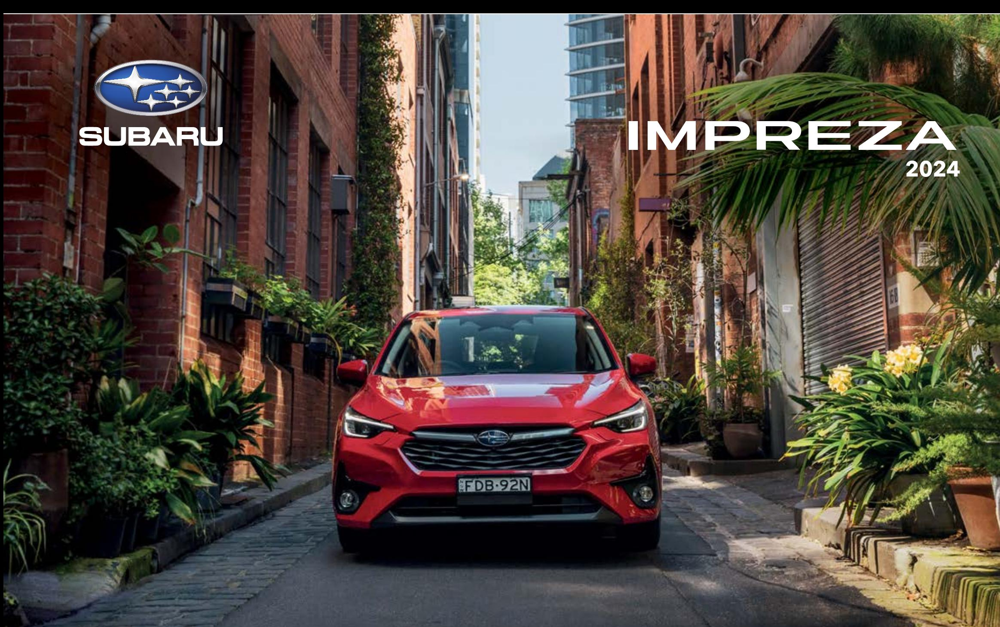

**Image 1 Description**:

The image showcases the 2024 Subaru Impreza positioned in a charming urban alleyway setting. The vehicle is presented in a striking red color, photographed head-on to emphasize its newly designed front fascia. The Subaru logo is prominently displayed in the top left corner of the image, while "IMPREZA 2024" appears in large text on the right side. The setting features historic red brick buildings on both sides of a narrow cobblestone or paved lane. The architecture has a distinctly industrial or warehouse conversion style, typical of trendy urban neighborhoods. The scene is enhanced by abundant greenery, including climbing vines on the brick walls, potted plants, and palm fronds visible in the foreground. The natural lighting appears to be during daytime, creating an appealing interplay between light and shadow in the alley. The Impreza's design features angular LED headlights, a prominent hexagonal grille with a wave-like pattern, and fog light housings that add to its modern, sophisticated appearance. The Australian license plate is visible on the front of the vehicle, indicating this is likely a promotional shot for the Australian market. The composition effectively combines urban architectural elements with nature, creating an aesthetically pleasing backdrop for the vehicle.

Size of image: 12640


**Image 2:**

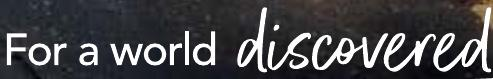

**Image 2 Description**:

The image shows a simple text-based design featuring a stylized typographic composition. The phrase "For a world discovered" is displayed prominently against what appears to be a dark or black background. The text is presented in two different typographic styles: "For a world" appears to be in a clean, straightforward sans-serif font, while the word "discovered" is written in an elegant, cursive or script-style font that adds a dynamic and flowing quality to the composition. The contrast between the two font styles creates visual interest and emphasizes the word "discovered." The overall aesthetic is minimalist yet impactful, with the white text standing out clearly against the dark background. The design appears to be part of a larger branding or marketing message, possibly aimed at conveying themes of exploration, discovery, or global perspective. The composition effectively combines formality with a touch of creativity through its typography choices. The dark background helps create a sense of depth and mystery that aligns well with the concept of discovery. The layout is balanced and professional, with the text centered and well-proportioned within the frame.

Size of image: 759856


**Image 3:**

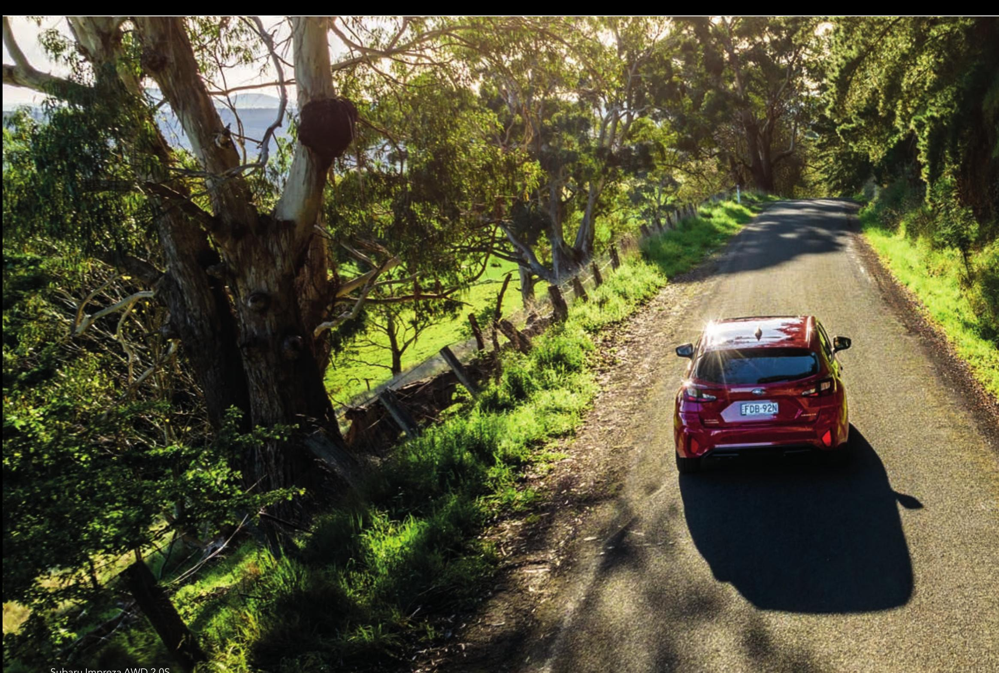

**Image 3 Description**:

The image shows a red Subaru Impreza AWD 2.0S traveling along a scenic country road. The vehicle is captured from an elevated angle, highlighting its metallic red exterior that gleams in the sunlight. The road is a narrow, winding rural path with gravel shoulders, cutting through lush Australian countryside. Tall eucalyptus trees line the road, creating a natural archway with their sprawling branches and characteristic pale trunks. The vegetation is notably verdant, with bright green grass covering the roadside slopes. Natural sunlight filters through the tree canopy, creating dappled shadows on the road surface. The composition captures the essence of Australian rural driving, with the contrast between the modern vehicle and the untamed natural surroundings. The car's shadow is prominently cast on the road surface, indicating it was photographed during mid-day when the sun was high. The road appears to curve gently ahead, disappearing into the tree-lined path. The scene evokes a sense of adventure and exploration in the Australian bush setting.

Size of image: 5296
Image size is too small, skipping image description...
Size of image: 5920
Image size is too small, skipping image description...
Size of image: 224368


**Image 6:**

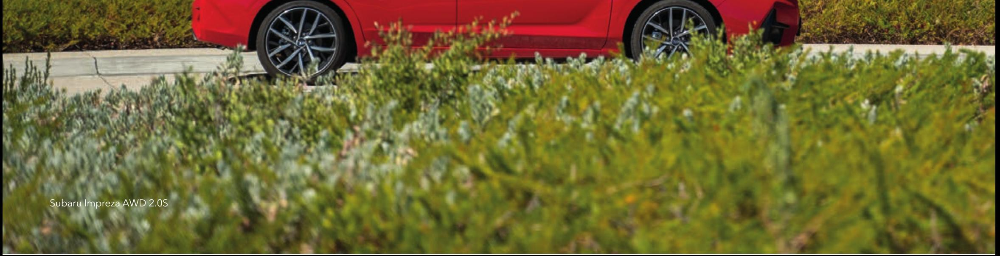

**Image 6 Description**:

The image shows a partial view of a bright red Subaru Impreza AWD 2.0S sedan. The car's side profile is visible in the upper portion of the frame, with particular emphasis on its sporty wheel design featuring distinctive multi-spoke alloy wheels with a dark gray finish. The wheels appear to be premium grade with a modern, aggressive styling that complements the vehicle's performance-oriented nature. The lower half of the image is dominated by green foliage or shrubbery that appears to be part of a landscaped area or garden bed. The car is positioned on what looks to be a concrete or light-colored pavement surface. The composition of the image creates an interesting contrast between the vibrant red of the vehicle and the natural green vegetation below. The Subaru's body lines are sleek and modern, suggesting this is a recent model year of the Impreza. The lighting in the image appears to be natural daylight, which highlights the car's bright paint finish. The photograph seems to be taken at a slight downward angle, creating an artistic perspective of the vehicle while maintaining focus on its sporty characteristics. The image also shows clean body panels and well-maintained exterior finish, indicating this is likely a newer or well-maintained vehicle.

Size of image: 94500


**Image 7:**

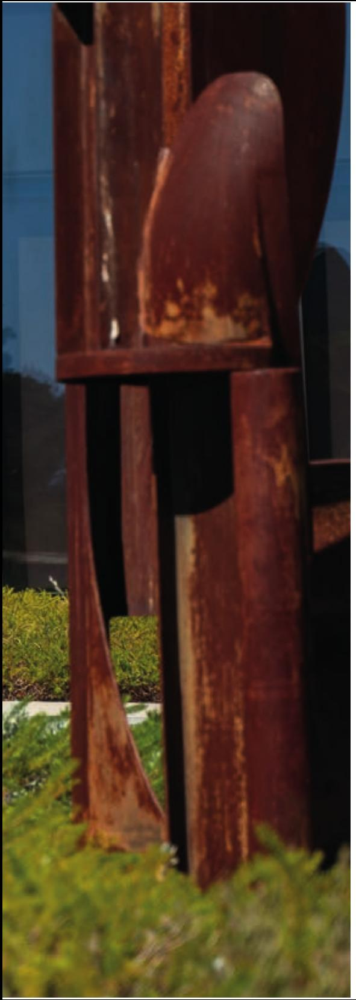

**Image 7 Description**:

The image shows a striking outdoor metal sculpture or architectural element composed of weathered steel components, likely Cor-ten steel known for its distinctive rusty patina. The sculpture features several vertical columns or pillars of varying heights, creating a dynamic composition against a natural backdrop. The steel elements have a rich, reddish-brown coloration characteristic of oxidized metal, with some areas showing different patterns of weathering and rust. The sculpture is positioned on what appears to be a grassy area, with bright green grass visible at the base of the structure. The metalwork has an industrial, minimalist aesthetic, with clean geometric forms that contrast beautifully with the organic surroundings. There is a box-like structure at the top of one of the pillars, suggesting a deliberate architectural design. The lighting in the image creates interesting shadows and highlights on the weathered surface of the steel, emphasizing its textural qualities. The overall composition appears to be part of a larger outdoor installation or garden sculpture, with the rustic metal elements creating a strong vertical presence in the landscape. The background appears slightly blurred, placing the focus on the sculptural elements themselves.

Size of image: 85404


**Image 8:**

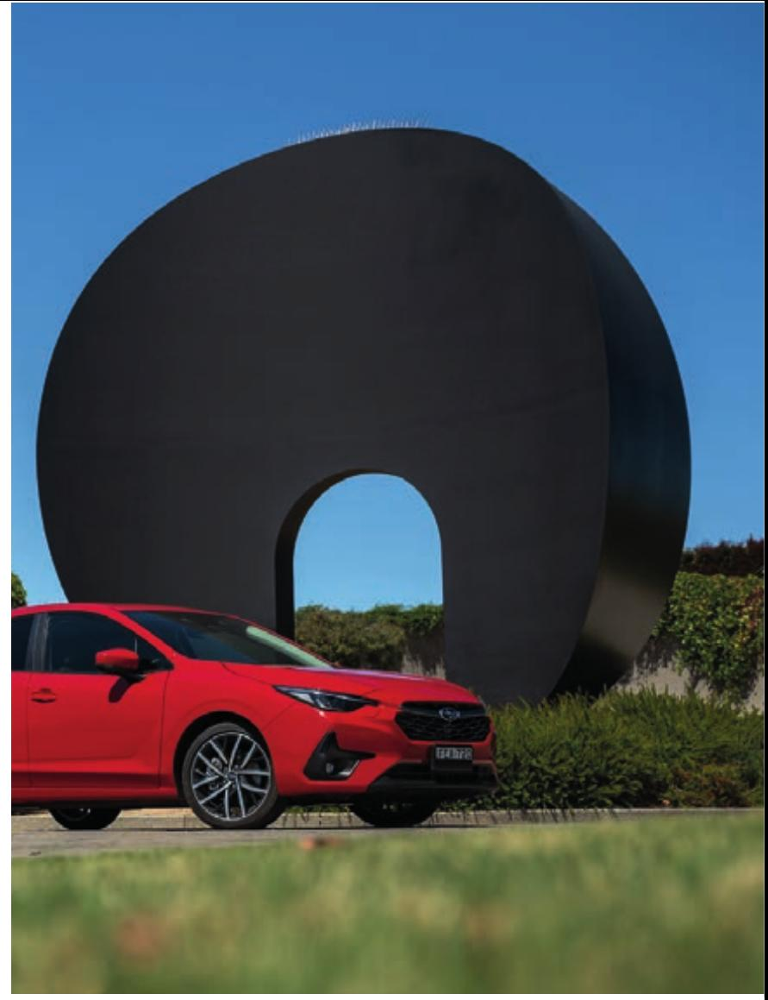

**Image 8 Description**:

The image shows a striking composition featuring a bright red Subaru vehicle positioned in front of a large, modern architectural element. The architectural piece is a massive black circular or curved structure with an arch-like opening, creating a dramatic contrast against the bright blue sky. The Subaru appears to be a newer model, likely an Impreza or similar model, with sporty styling and distinctive alloy wheels. The car's bright red paint finish creates a bold contrast against both the black structure and the natural surroundings. The foreground shows a grass lawn area, while the background reveals some green foliage and trees. The photograph is professionally composed, with the curved black structure serving as a strong architectural focal point that frames the vehicle. The lighting appears to be natural daylight, which helps highlight the car's aggressive modern design features and metallic paint. The image has a clean, contemporary aesthetic that combines architectural design with automotive photography. The black structure appears to be a piece of public art or architectural installation, though its full context is not visible in the frame. The overall composition suggests this is a professional automotive marketing or advertising photograph.

Size of image: 113840


**Image 9:**

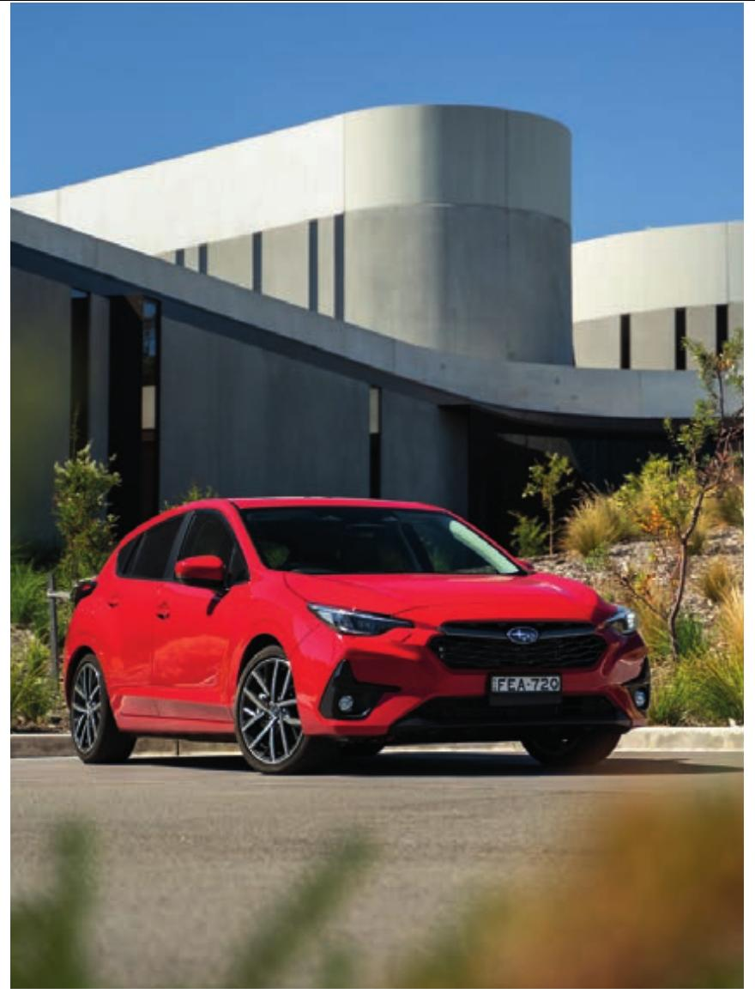

**Image 9 Description**:

The image shows a vibrant red Subaru Impreza hatchback parked in front of a modern architectural building. The vehicle features Subaru's latest design language with sharp angular headlights, a prominent hexagonal grille with the Subaru badge, and athletic body lines that give it a sporty appearance. The car is equipped with stylish multi-spoke alloy wheels that complement its dynamic stance. The vehicle appears to be an Australian-market model, as evidenced by the visible NSW license plate. The background showcases a contemporary building with distinctive architectural elements, including a curved white upper structure and dark lower walls. The landscaping around the building includes ornamental grasses and young trees, creating an attractive contrast with the building's modern aesthetic. The image is taken during daytime with clear blue skies, and the lighting highlights the car's glossy red paint finish beautifully. The composition places the vehicle at an angle that emphasizes its sporty profile while incorporating the architectural elements in the background to create a balanced and visually appealing photograph. The overall scene suggests a premium, urban environment that aligns well with the car's modern design aesthetic.

Size of image: 121204


**Image 10:**

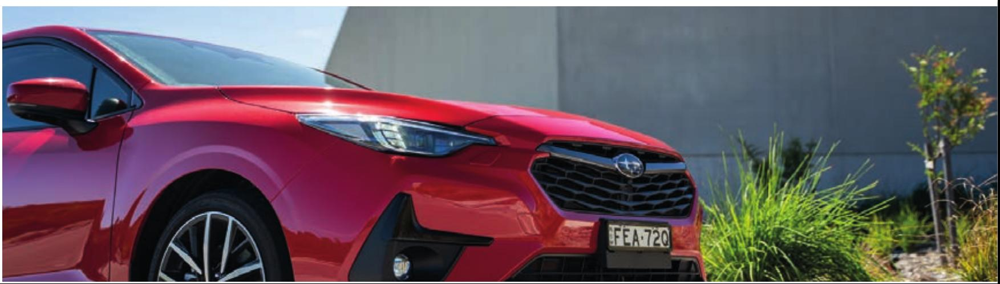

**Image 10 Description**:

The image shows a close-up front quarter view of a modern Subaru vehicle in a striking metallic red color. The car appears to be a newer model, featuring Subaru's distinctive hexagonal grille with a honeycomb pattern and the Subaru badge prominently displayed in the center. The vehicle's sleek LED headlights have a sharp, angular design that flows into the sculptured hood and fenders. The front bumper includes integrated fog lights and aggressive styling elements that give the car a sporty appearance. The wheel visible in the frame shows an attractive multi-spoke alloy design with a machined finish. The car is photographed against a grey wall background with some green foliage visible on the right side of the frame. The lighting appears to be natural daylight, which highlights the car's curves and body lines effectively. The vehicle has an Australian license plate visible, indicating this photo was taken in Australia. The paint finish appears to be in excellent condition, showing deep reflections and a premium glossy appearance. The overall composition emphasizes the car's modern design language and premium positioning in the market.

Size of image: 5204
Image size is too small, skipping image description...
Size of image: 4596
Image size is too small, skipping image description...
Size of image: 3988
Image size is too small, skipping image description...
Size of image: 334656


**Image 14:**

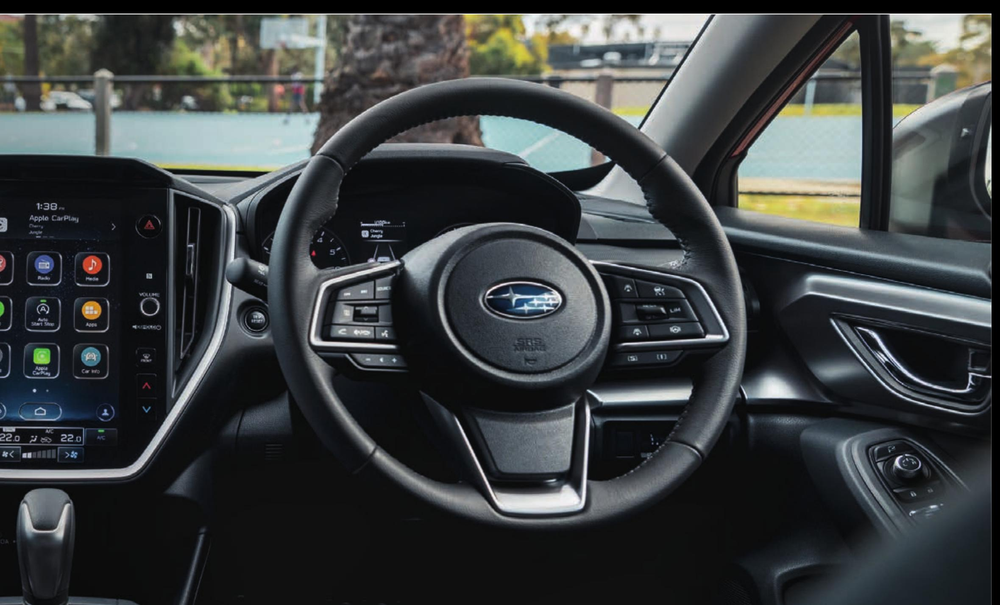

**Image 14 Description**:

The image shows the modern interior dashboard and steering wheel of a Subaru vehicle. The centerpiece is a large touchscreen infotainment system displaying Apple CarPlay integration with various app icons visible including music, phone, and navigation options. The steering wheel is leather-wrapped with a modern design featuring silver accents and multiple control buttons on both sides for various vehicle functions. The Subaru logo is prominently displayed in the center of the steering wheel on the airbag cover. The dashboard has a clean, contemporary design with a digital instrument cluster visible behind the steering wheel. The interior appears to be finished in black materials with high-quality textures and silver trim accents throughout. The temperature display shows 22.0 degrees, indicating automatic climate control functionality. The overall design emphasizes a premium feel with modern technology integration while maintaining an intuitive layout. The image is taken from the driver's side perspective, showing excellent build quality and attention to detail in the interior design. The visibility of various controls and interfaces suggests this is a well-equipped model with numerous modern convenience features.

Size of image: 86684


**Image 15:**

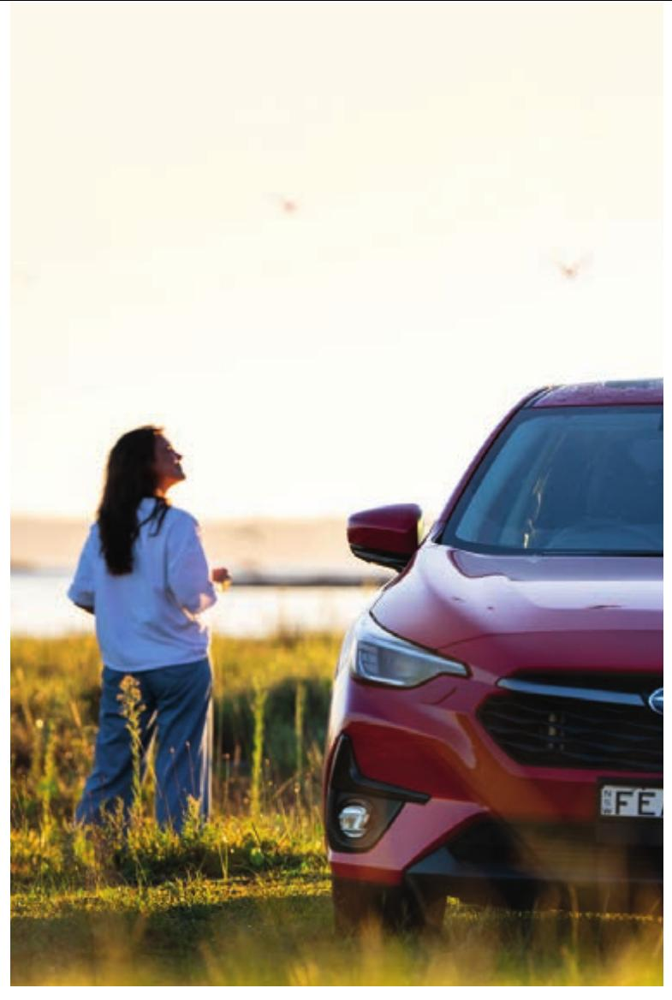

**Image 15 Description**:

The image captures a serene outdoor scene during what appears to be golden hour, with warm sunlight casting a beautiful glow across the landscape. In the frame, a person wearing a white casual top and blue jeans stands in a field of tall grass and wildflowers, looking upward toward the sky in a contemplative pose. Next to them is a modern red SUV, which appears to be a newer model with sleek design elements including distinctive LED headlights and a glossy metallic finish. The front quarter panel and grille of the vehicle are prominently featured in the shot. The setting suggests a rural or natural environment, with grass and vegetation visible in the foreground, creating a striking contrast between the natural elements and the modern vehicle. The lighting conditions create a soft, atmospheric quality to the image, with the background showing hints of a sunset or sunrise sky. The composition effectively balances the human element, the vehicle, and the natural environment, creating an advertisement-worthy automotive photograph that conveys a sense of adventure and connection with nature.

In [65]:
from IPython.display import Markdown, display

for i, item in enumerate(images[:15]):
    image_node, _ = ImageDescriber(instructor_client).describe(item)
    if image_node is not None:
        display(Markdown(f"**Image {i+1}:**"))
        display_base64_image(item)
        display(Markdown(f"**Image {i+1} Description**:"))
        display(Markdown(image_node.description))